**This code will generate the heatmap image for FreeViewing Task**
- Input:
    - img filename
    - participant name
    - window size

- Output:
    - heatmap image with fixation points

Caution: Recover the coordinates before plotting the scanpath image.

*The code bellow will plot heatmap for one person*
- *Parameters should be adjusted if you want to plot for all participants*

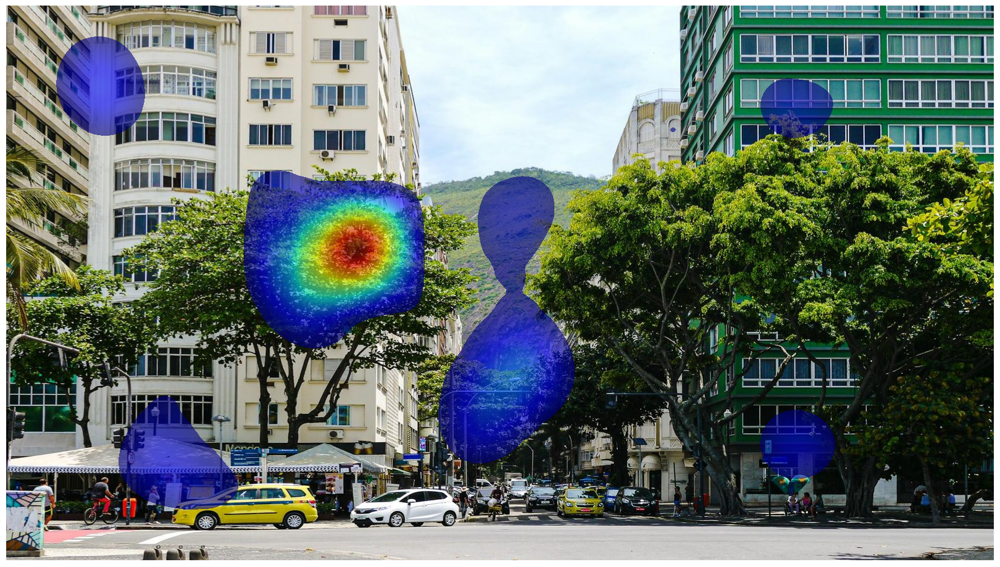

In [69]:
import os
import csv
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import image
import pandas as pd
import cv2

class GazeHeatmap:
    def __init__(self, participant, image_name, window_size, display_width=1600, display_height=900, alpha=0.6, n_gaussian_matrix=200, standard_deviation=50):
        self.root_dir = '../../../'
        self.participant = participant
        self.image_name = image_name
        self.image_name_clean = image_name.split('.')[0]
        self.window_size = window_size # seconds
        self.window_frames = self.window_size * 60 # 60Hz
        
        self.image_path = os.path.join(self.root_dir, 'Data_Collection/FreeViewing/Training/', self.image_name)
        self.display_width = display_width
        self.display_height = display_height
        self.alpha = alpha
        self.n_gaussian_matrix = n_gaussian_matrix
        self.standard_deviation = standard_deviation
        
        self.input_filepath = os.path.join(self.root_dir, f'Preprocess/FreeViewing/Data/{self.participant}_IMG_1.csv')
        self.output_filepath = os.path.join(self.root_dir, 'Analysis/Visualization/FreeViewing/Result/Heatmap', f'{self.participant}_{self.image_name_clean}_{self.window_size}sec.jpg')

    def draw_display(self):
        screen = np.zeros((self.display_height, self.display_width, 3), dtype='float32')
        if self.image_path is not None:
            if not os.path.isfile(self.image_path):
                raise Exception(f"ERROR in draw_display: imagefile not found at '{self.image_path}'")
            # Load image with matplotlib's image module
            img = image.imread(self.image_path)
            # Ensure the image is in the correct format
            if img.dtype == np.float32:
                # Normalize if the image is in float format (common for .png)
                img = np.clip(img, 0, 1)
            elif img.dtype == np.uint8:
                # Convert to float and normalize if the image is in byte format (common for .jpg)
                img = img.astype('float32') / 255

            # width and height of the image
            w, h = img.shape[1], img.shape[0]
            # x and y position of the image on the display
            x = self.display_width // 2 - w // 2
            y = self.display_height // 2 - h // 2
            # draw the image on the screen
            screen[y:y + h, x:x + w, :] += img[:,:,:3]  # Use only RGB channels
        dpi = 100.0
        figsize = (self.display_width / dpi, self.display_height / dpi)
        fig = plt.figure(figsize=figsize, dpi=dpi, frameon=False)
        ax = plt.Axes(fig, [0, 0, 1, 1])
        ax.set_axis_off()
        fig.add_axes(ax)
        ax.axis([0, self.display_width, 0, self.display_height])
        ax.imshow(screen)
        return fig, ax

    def gaussian(self, x, sx, y=None, sy=None):
        if y is None:
            y = x
        if sy is None:
            sy = sx
        xo = x // 2
        yo = y // 2
        M = np.zeros([y, x], dtype=float)
        for i in range(x):
            for j in range(y):
                M[j, i] = np.exp(-1.0 * (((float(i) - xo) ** 2 / (2 * sx ** 2)) + ((float(j) - yo) ** 2 / (2 * sy ** 2))))
        return M

    def draw_heatmap(self):
        fig, ax = self.draw_display()
        gwh = self.n_gaussian_matrix
        gsdwh = gwh // 6 if (self.standard_deviation is None) else self.standard_deviation
        gaus = self.gaussian(gwh, gsdwh)
        strt = gwh // 2
        heatmapsize = self.display_height + 2 * strt, self.display_width + 2 * strt
        heatmap = np.zeros(heatmapsize, dtype=float)
        for i in range(len(self.gaze_data)):
            x = strt + self.gaze_data[i][0] - gwh // 2
            y = strt + self.gaze_data[i][1] - gwh // 2
            if 0 > x or x > self.display_width or 0 > y or y > self.display_height:
                continue
            heatmap[y:y + gwh, x:x + gwh] += gaus * self.gaze_data[i][2]
        heatmap = heatmap[strt:self.display_height + strt, strt:self.display_width + strt]

        # Apply Gaussian blur to smooth the heatmap
        heatmap = cv2.GaussianBlur(heatmap, (21, 21), 0)

        lowbound = np.percentile(heatmap[heatmap > 0], 85)  # Adjust the percentile as needed
        heatmap[heatmap < lowbound] = np.NaN
        ax.imshow(heatmap, cmap='jet', alpha=self.alpha, vmin=lowbound, vmax=np.nanmax(heatmap))
        ax.invert_yaxis()
        if self.output_filepath is not None:
            fig.savefig(self.output_filepath)
        return fig

    # Function to scale the coordinates from 1600x900 to 1920x1080
    def transform_coordinate(self, p):
        return (6/5 * p[0] - 1/10, 9/8 * p[1] - 1/16)

    def to_pixel(self, coord):
        coord = eval(coord)
        if len(coord)!= 2 or coord[0] == None or coord[1] == None: return (None, None)
        coord = self.transform_coordinate(coord)
        return (coord[0] * self.display_width, coord[1] * self.display_height)

    def run(self):
        df = pd.read_csv(self.input_filepath)
        # Create a condition to filter the DataFrame
        condition = df['stimuli'] == self.image_name_clean
        selected_data = df[condition].iloc[-self.window_frames:]
        # selected_data = df[condition].iloc[:self.window_frames]
        
        self.MW = selected_data['state'].iloc[0] == 'num_6'
        gaze_cor_name = "{}_gaze_point_on_display_area".format(df.loc[condition, 'eye_to_use'].iloc[0])
        
        df.loc[condition, 'pixel_gaze_point'] = df.loc[condition, gaze_cor_name].apply(self.to_pixel)
        gaze_data_list = df.loc[condition, 'pixel_gaze_point'].tolist()
        # Filter out (None, None) entries
        filtered_gaze_data_list = [cor for cor in gaze_data_list if cor != (None, None)]
        self.gaze_data = [(int(cor[0]), int(cor[1]), 1) for cor in filtered_gaze_data_list]
        self.draw_heatmap()

if __name__ == '__main__':
    participant = '1Y'
    image_name = 'Brazil_1.jpg'
    window_size = 1 # seconds
    
    heatmap = GazeHeatmap(participant, image_name, window_size)
    heatmap.run()


**This code below will generate the heatmap image for FreeViewing Task for all participants**
- Input:
    - img filename
    - window size

- Output:
    - heatmap image with fixation points

Caution: Recover the coordinates before plotting the scanpath image.

/var/folders/zc/fkpm0hsj0r1gzsj_01r5msv80000gn/T/ipykernel_37845/1885710004.py:128: DtypeWarning: Columns (9,10,11,12) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(input_filepath)
/var/folders/zc/fkpm0hsj0r1gzsj_01r5msv80000gn/T/ipykernel_37845/1885710004.py:128: DtypeWarning: Columns (9,10,11,12) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(input_filepath)
/var/folders/zc/fkpm0hsj0r1gzsj_01r5msv80000gn/T/ipykernel_37845/1885710004.py:128: DtypeWarning: Columns (9,10,11,12) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(input_filepath)
/var/folders/zc/fkpm0hsj0r1gzsj_01r5msv80000gn/T/ipykernel_37845/1885710004.py:128: DtypeWarning: Columns (9,10,11,12) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(input_filepath)
/var/folders/zc/fkpm0hsj0r1gzsj_01r5msv80000gn/T/ipykernel_37845/1885710004.py:128: Dtyp

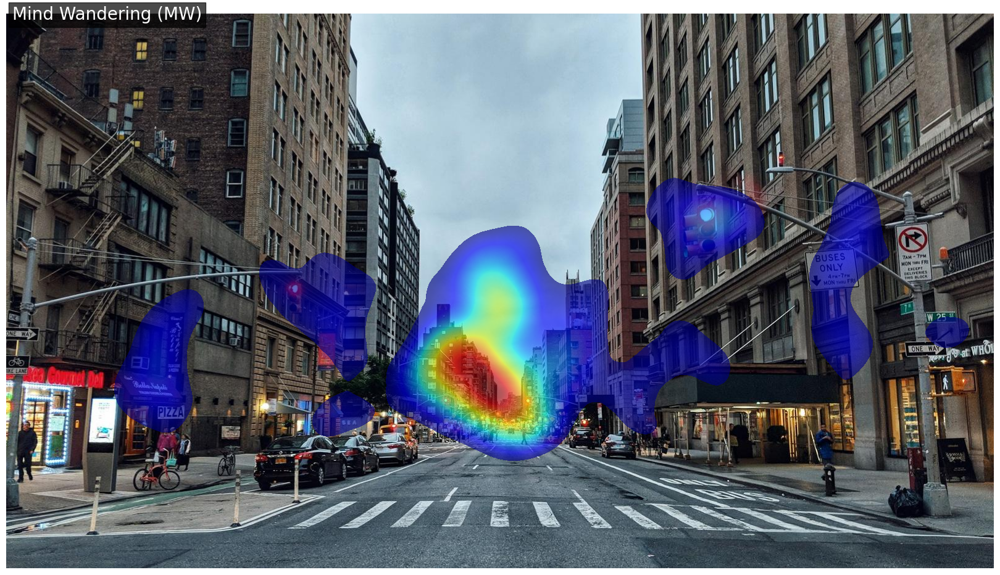

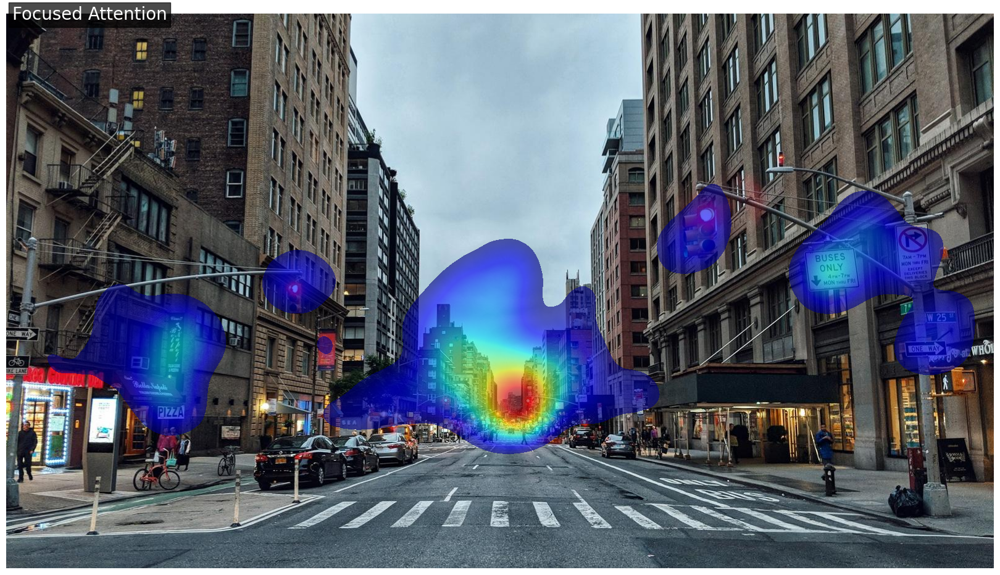

In [70]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import image
import pandas as pd
import cv2

class GazeHeatmap:
    def __init__(self, image_name, window_size, blacklist, display_width=1600, display_height=900, alpha=0.6, n_gaussian_matrix=120, standard_deviation=30):
        self.root_dir = '../../../'
        self.image_name = image_name
        self.image_name_clean = image_name.split('.')[0]
        self.window_size = window_size # seconds
        self.window_frames = self.window_size * 60 # 60Hz
        self.blacklist = blacklist

        self.image_path = os.path.join(self.root_dir, 'Data_Collection/FreeViewing/Training/', self.image_name)
        self.display_width = display_width
        self.display_height = display_height
        self.alpha = alpha
        self.n_gaussian_matrix = n_gaussian_matrix
        self.standard_deviation = standard_deviation
        self.resize_image(self.image_path, self.display_width, self.display_height)

        self.output_filepath_mw1 = os.path.join(self.root_dir, 'Analysis/Visualization/FreeViewing/Result/Heatmap', f'combined_{self.image_name_clean}_{self.window_size}sec_mw1.jpg')
        self.output_filepath_mw0 = os.path.join(self.root_dir, 'Analysis/Visualization/FreeViewing/Result/Heatmap', f'combined_{self.image_name_clean}_{self.window_size}sec_mw0.jpg')

    def resize_image(self, image_path, width, height):
        image = cv2.imread(image_path)
        if image is None:
            print("Failed to load image. Please check the image path.")
            return
        if image.shape[1] == self.display_width and image.shape[0] == self.display_height:
            pass
        else:
            resized_image = cv2.resize(image, (self.display_width, self.display_height))
            cv2.imwrite(image_path, resized_image)
            print(f"Image resized to {width}x{height} and saved with correct color.")
        
    def draw_display(self):
        screen = np.zeros((self.display_height, self.display_width, 3), dtype='float32')
        if self.image_path is not None:
            if not os.path.isfile(self.image_path):
                raise Exception(f"ERROR in draw_display: imagefile not found at '{self.image_path}'")
            img = image.imread(self.image_path)
            if img.dtype == np.float32:
                img = np.clip(img, 0, 1)
            elif img.dtype == np.uint8:
                img = img.astype('float32') / 255

            w, h = img.shape[1], img.shape[0]
            x = self.display_width // 2 - w // 2
            y = self.display_height // 2 - h // 2
            screen[y:y + h, x:x + w, :] += img[:,:,:3]
        dpi = 100.0
        figsize = (self.display_width / dpi, self.display_height / dpi)
        fig = plt.figure(figsize=figsize, dpi=dpi, frameon=False)
        ax = plt.Axes(fig, [0, 0, 1, 1])
        ax.set_axis_off()
        fig.add_axes(ax)
        ax.axis([0, self.display_width, 0, self.display_height])
        ax.imshow(screen)
        return fig, ax

    def gaussian(self, x, sx, y=None, sy=None):
        if y is None:
            y = x
        if sy is None:
            sy = sx
        xo = x // 2
        yo = y // 2
        M = np.zeros([y, x], dtype=float)
        for i in range(x):
            for j in range(y):
                M[j, i] = np.exp(-1.0 * (((float(i) - xo) ** 2 / (2 * sx ** 2)) + ((float(j) - yo) ** 2 / (2 * sy ** 2))))
        return M

    def draw_heatmap(self, gaze_data, output_filepath, title):
        fig, ax = self.draw_display()
        gwh = self.n_gaussian_matrix
        gsdwh = gwh // 6 if (self.standard_deviation is None) else self.standard_deviation
        gaus = self.gaussian(gwh, gsdwh)
        strt = gwh // 2
        heatmapsize = self.display_height + 2 * strt, self.display_width + 2 * strt
        heatmap = np.zeros(heatmapsize, dtype=float)
        for i in range(len(gaze_data)):
            x = strt + gaze_data[i][0] - gwh // 2
            y = strt + gaze_data[i][1] - gwh // 2
            if 0 > x or x > self.display_width or 0 > y or y > self.display_height:
                continue
            heatmap[y:y + gwh, x:x + gwh] += gaus * gaze_data[i][2]
        heatmap = heatmap[strt:self.display_height + strt, strt:self.display_width + strt]

        heatmap = cv2.GaussianBlur(heatmap, (21, 21), 0)

        lowbound = np.percentile(heatmap[heatmap > 0], 85)
        heatmap[heatmap < lowbound] = np.NaN
        ax.imshow(heatmap, cmap='jet', alpha=self.alpha, vmin=lowbound, vmax=np.nanmax(heatmap))
        ax.invert_yaxis()
        
        # Add title to indicate MW or Focus
        ax.text(10, 10, title, color='white', fontsize=20, bbox=dict(facecolor='black', alpha=0.7))
        
        if output_filepath is not None:
            fig.savefig(output_filepath)
        return fig

    def transform_coordinate(self, p):
        return (6/5 * p[0] - 1/10, 9/8 * p[1] - 1/16)

    def to_pixel(self, coord):
        coord = eval(coord)
        if len(coord) != 2 or coord[0] == None or coord[1] == None:
            return (None, None)
        coord = self.transform_coordinate(coord)
        return (coord[0] * self.display_width, coord[1] * self.display_height)

    def collect_gaze_data(self):
        gaze_data_mw1 = []
        gaze_data_mw0 = []
        input_filedir = os.path.join(self.root_dir, 'Preprocess/FreeViewing/Data')
        for file_name in os.listdir(input_filedir):
            if file_name.startswith('.'): continue
            participant = file_name.split('_')[0]
            if participant in self.blacklist:
                continue
            input_filepath = os.path.join(input_filedir, file_name)
            df = pd.read_csv(input_filepath)
            condition = df['stimuli'] == self.image_name_clean
            selected_data = df[condition].iloc[-self.window_frames:]

            mw_state = selected_data['state'].iloc[0] == 'num_6'
            gaze_cor_name = "{}_gaze_point_on_display_area".format(df.loc[condition, 'eye_to_use'].iloc[0])
            df.loc[condition, 'pixel_gaze_point'] = df.loc[condition, gaze_cor_name].apply(self.to_pixel)
            gaze_data_list = df.loc[condition, 'pixel_gaze_point'].tolist()
            filtered_gaze_data_list = [cor for cor in gaze_data_list if cor != (None, None)]
            participant_gaze_data = [(int(cor[0]), int(cor[1]), 1) for cor in filtered_gaze_data_list]
            
            if mw_state:
                gaze_data_mw1.extend(participant_gaze_data)
            else:
                gaze_data_mw0.extend(participant_gaze_data)
        
        self.gaze_data_mw1 = gaze_data_mw1
        self.gaze_data_mw0 = gaze_data_mw0

    def run(self):
        self.collect_gaze_data()
        self.draw_heatmap(self.gaze_data_mw1, self.output_filepath_mw1, "Mind Wandering (MW)")
        self.draw_heatmap(self.gaze_data_mw0, self.output_filepath_mw0, "Focused Attention")

if __name__ == '__main__':
    image_name = 'NYC_1.jpg'
    window_size = 1 # seconds
    blacklist = ["22K", "25I", "29N", "39Y", "8I", "32S", "37T"]
    
    heatmap = GazeHeatmap(image_name, window_size, blacklist)
    heatmap.run()
